In [34]:
import geopandas as gpd
import os
import matplotlib.pyplot as plt
import contextily as cx
import folium
from src.utils import *
import branca.colormap as cmp

In [24]:
districts = gpd.read_file('data/districts.zip')
noise = gpd.read_file('data/noise.zip')
noise_barrier = gpd.read_file('data/noise_barrier.zip')
noise_embankments = gpd.read_file('data/noise_embankments.zip')
retaining_walls = gpd.read_file('data/retaining_walls.zip')
viewpoints = gpd.read_file('data/viewpoints.zip')

In [25]:
district_name = 'Praha 14'
noise_in_district, selected_district = filter_poligon(noise, districts, district_name)
noise_barrier_in_district, _ = filter_poligon(noise_barrier, districts, district_name)
noise_embankments_in_district, _ = filter_poligon(noise_embankments, districts, district_name)
retaining_walls_in_district, _ = filter_poligon(retaining_walls, districts, district_name)
viewpoints_in_district, _ = filter_poligon(viewpoints, districts, district_name)

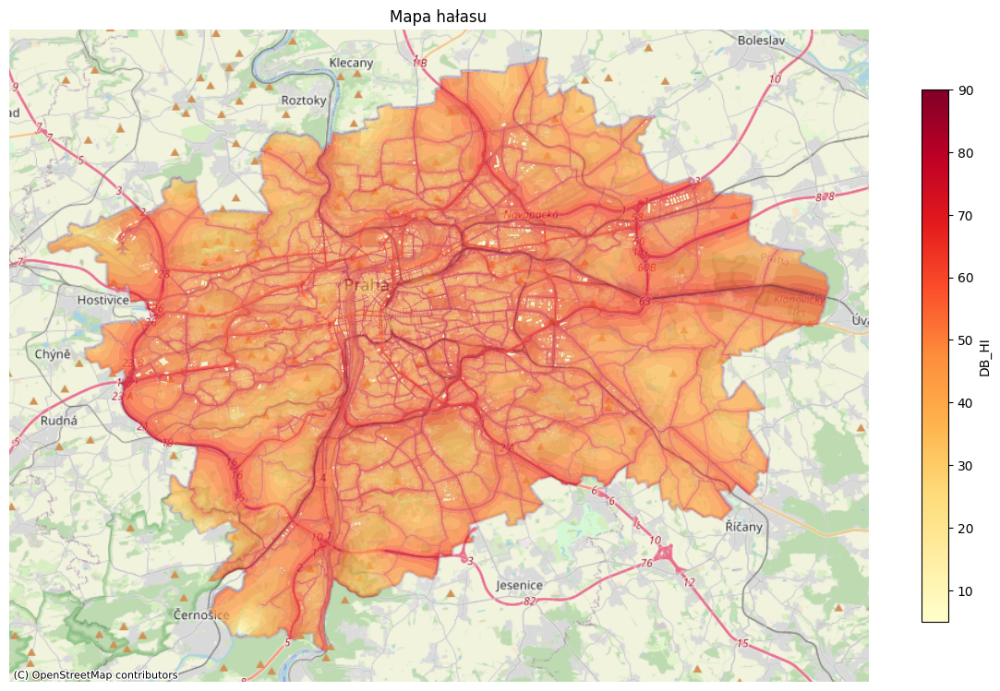

In [26]:
gdf = noise.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(15, 15))

gdf.plot(column='DB_HI', 
        cmap='YlOrRd',
        legend=True,
        alpha=0.7, 
        ax=ax,
        legend_kwds={'shrink': 0.5, 'label': 'DB_HI'}
)

cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

ax.set_title('Mapa hałasu')
ax.set_axis_off();

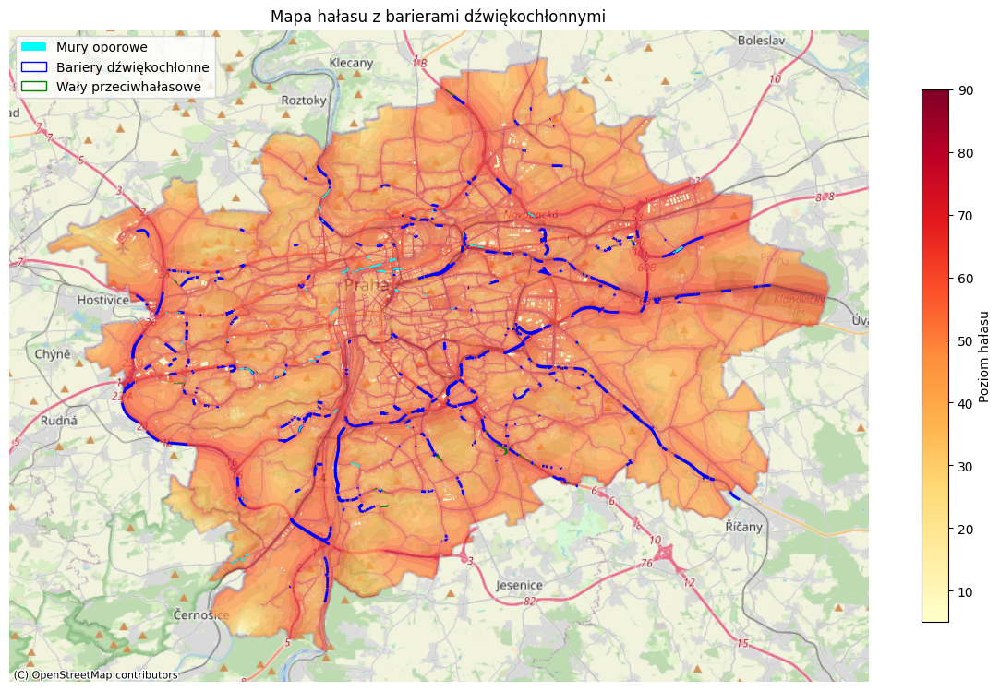

In [27]:
from matplotlib.patches import Patch

noise_map = noise
noise_map = noise_map.to_crs(epsg=3857)

barriers = noise_barrier
barriers = barriers.to_crs(epsg=3857)

barriers2 = noise_embankments
barriers2 = barriers2.to_crs(epsg=3857)

walls = retaining_walls
walls = walls.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(15, 15))

noise_map.plot(
    column="DB_HI", 
    cmap="YlOrRd", 
    legend=True, 
    alpha=0.7, 
    ax=ax,
    legend_kwds={"shrink": 0.5, "label": "Poziom hałasu"}
)

barriers.plot(
    color="blue",  
    linewidth=2,
    ax=ax
)

barriers2.plot(
    color="green",  
    linewidth=2,
    ax=ax
)

walls.plot(
    color="cyan", 
    edgecolor="cyan", 
    linewidth=1,
    ax=ax
)

cx.add_basemap(ax, crs=noise_map.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

ax.set_title("Mapa hałasu z barierami dźwiękochłonnymi")

legend_elements = [
    Patch(facecolor="cyan", label="Mury oporowe"),
    Patch(edgecolor="blue", facecolor="none", label="Bariery dźwiękochłonne"),
    Patch(edgecolor="green", facecolor="none", label="Wały przeciwhałasowe")
]

ax.legend(handles=legend_elements, loc="upper left")
ax.set_axis_off()

plt.show()


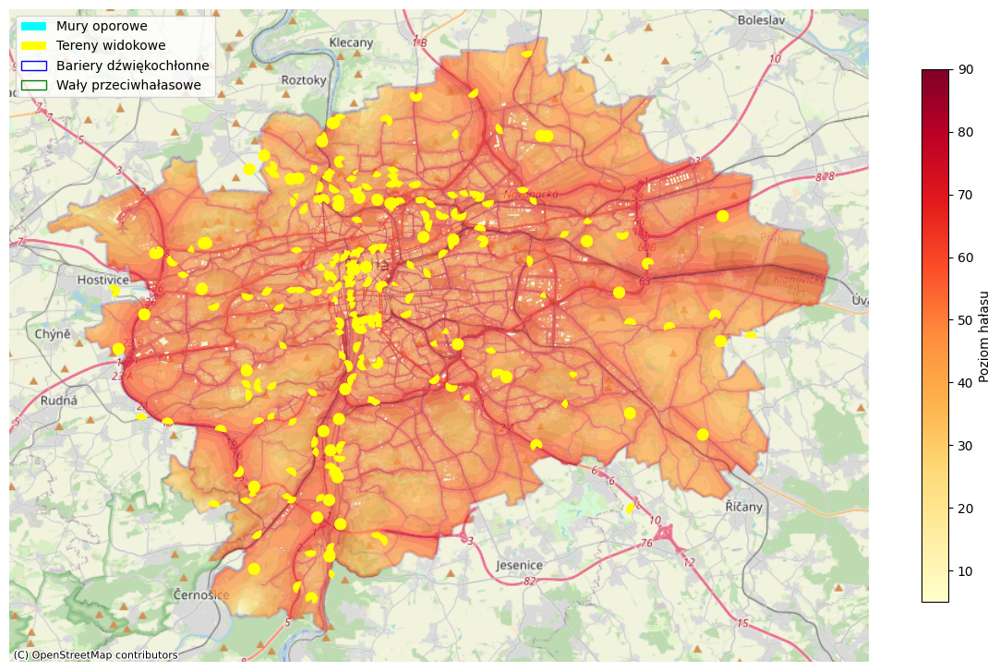

In [28]:
viewpoints = viewpoints.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(15, 15))

noise_map.plot(
    column="DB_HI", 
    cmap="YlOrRd", 
    legend=True, 
    alpha=0.7, 
    ax=ax,
    legend_kwds={"shrink": 0.5, "label": "Poziom hałasu"}
)

viewpoints.plot(
    color="yellow", 
    edgecolor="yellow", 
    linewidth=1,
    ax=ax
)

cx.add_basemap(ax, crs=noise_map.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

legend_elements = [
    Patch(facecolor="cyan", label="Mury oporowe"),
    Patch(facecolor="yellow", label="Tereny widokowe"),
    Patch(edgecolor="blue", facecolor="none", label="Bariery dźwiękochłonne"),
    Patch(edgecolor="green", facecolor="none", label="Wały przeciwhałasowe")
]

ax.legend(handles=legend_elements, loc="upper left")
ax.set_axis_off()

plt.show()

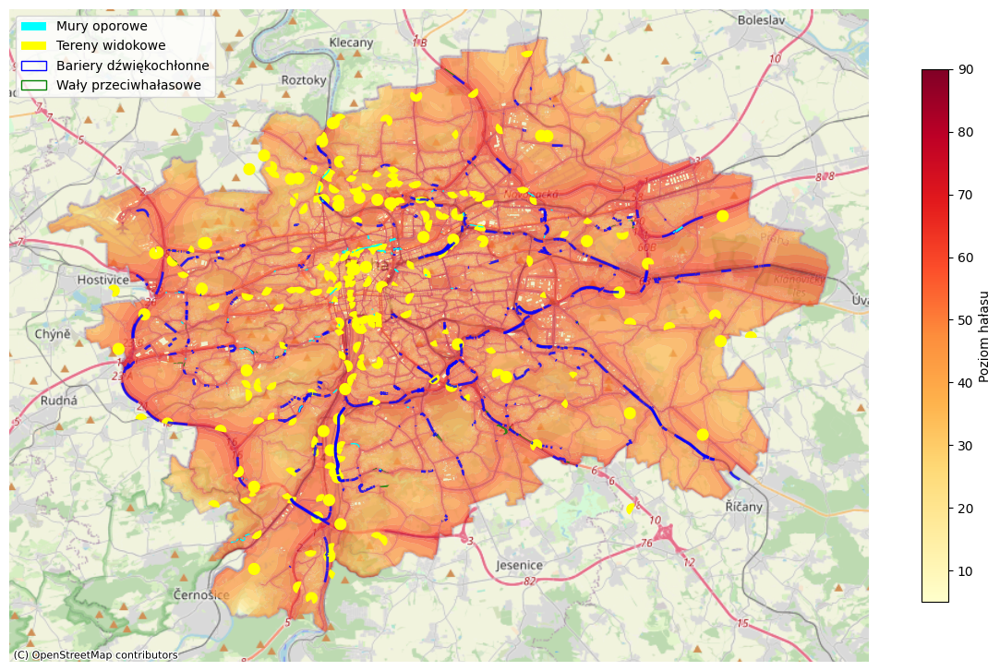

In [29]:
viewpoints = viewpoints.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(15, 15))

noise_map.plot(
    column="DB_HI", 
    cmap="YlOrRd", 
    legend=True, 
    alpha=0.7, 
    ax=ax,
    legend_kwds={"shrink": 0.5, "label": "Poziom hałasu"}
)

barriers.plot(
    color="blue",  
    linewidth=2,  
    alpha=0.8,
    ax=ax
)

barriers2.plot(
    color="green", 
    linewidth=2,  
    alpha=0.8,
    ax=ax
)

walls.plot(
    color="cyan", 
    edgecolor="cyan", 
    linewidth=1,
    ax=ax
)
viewpoints.plot(
    color="yellow", 
    edgecolor="yellow", 
    linewidth=1,
    ax=ax
)

cx.add_basemap(ax, crs=noise_map.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

legend_elements = [
    Patch(facecolor="cyan", label="Mury oporowe"),
    Patch(facecolor="yellow", label="Tereny widokowe"),
    Patch(edgecolor="blue", facecolor="none", label="Bariery dźwiękochłonne"),
    Patch(edgecolor="green", facecolor="none", label="Wały przeciwhałasowe")
]

ax.legend(handles=legend_elements, loc="upper left")
ax.set_axis_off()

plt.show()

## Interactive map

In [31]:
noise_in_district = noise_in_district.to_crs(epsg=4326)
noise_barrier_in_district = noise_barrier_in_district.to_crs(epsg=4326)
noise_embankments_in_district = noise_embankments_in_district.to_crs(epsg=4326)
retaining_walls_in_district = retaining_walls_in_district.to_crs(epsg=4326)
viewpoints_in_district = viewpoints_in_district.to_crs(epsg=4326)

In [42]:
m = folium.Map(location = [50.08804, 14.42076], zoom_start = 12)

folium.GeoJson(
    selected_district,
    name = 'Districts',
    style_function = lambda x: {'color': 'black', 
                                'fillColor': 'lightblue', 
                                'weight': 2, 
                                'fillOpacity': 0.4},
    tooltip = folium.GeoJsonTooltip(fields = ['NAZEV_MC'], aliases = ['District']),
).add_to(m)

folium.GeoJson(
    noise_in_district,
    name = 'Noise',
    style_function = lambda feature: style_function(feature, noise_in_district, 'DB_LO', 'turbo'),
    tooltip = folium.GeoJsonTooltip(fields = ['DB_LO'], aliases = ['Noise Level']),
).add_to(m)

folium.GeoJson(
    noise_barrier_in_district,
    name = 'Noise barrier',
    style_function = lambda x: {'color': 'black', 
                                'fillColor': 'magenta', 
                                'weight': 2, 
                                'fillOpacity': 0.8},
).add_to(m)

folium.GeoJson(
    noise_embankments_in_district,
    name = 'Noise embankments',
    style_function = lambda x: {'color': 'black', 
                                'fillColor': 'darkgreen', 
                                'weight': 2, 
                                'fillOpacity': 0.8},
).add_to(m)

folium.GeoJson(
    retaining_walls_in_district,
    name = 'Retaining walls',
    style_function = lambda x: {'color': 'black', 
                                'fillColor': 'darkgreen', 
                                'weight': 2, 
                                'fillOpacity': 0.4},
).add_to(m)

folium.GeoJson(
    viewpoints_in_district,
    name = 'Viewpoints',
    style_function = lambda x: {'color': 'black', 
                                'fillColor': 'red', 
                                'weight': 2, 
                                'fillOpacity': 0.4},
).add_to(m)



step = cmp.StepColormap(
colorbar(18),
vmin = 0, 
vmax = 85,
caption = 'Noise level'
)
m.add_child(step)

folium.LayerControl().add_to(m)

m